# Version Checking & Import Libraries 

In [166]:
import sys 
import numpy as np
import pandas as pd
print("Python Version:", sys.version, '\n')
print("Numpy Version: ", np.__version__)

Python Version: 3.8.8 (default, Apr 13 2021, 15:08:03) [MSC v.1916 64 bit (AMD64)] 

Numpy Version:  1.20.1


# Loading Data

In [167]:
df = pd.read_excel('Dataset King Abdul-Aziz Airport Slot Managment utilization.xlsx')

# Exploring Data

In [168]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 10009 entries, 0 to 10008
Data columns (total 45 columns):
 #   Column                          Non-Null Count  Dtype  
---  ------                          --------------  -----  
 0   TERMINAL                        10009 non-null  object 
 1   AIRPORT_STRCTR_NM               9495 non-null   object 
 2   AIRPORT_STRCTR_CODE             9495 non-null   object 
 3   A/D                             10009 non-null  object 
 4   ARCFT_TYP                       8352 non-null   object 
 5   ARCFT_RGSTR                     10009 non-null  object 
 6   MAX_TAKE_OFF_WEIGHT             8216 non-null   float64
 7   CARR_NME                        9495 non-null   object 
 8   CARR_COUNTRY_CODE               9495 non-null   object 
 9   CARR_COUNTRY                    9495 non-null   object 
 10  FLT_NMBR                        9495 non-null   object 
 11  IATA                            9495 non-null   object 
 12  CTGRY                           

In [103]:
df.head()

,TERMINAL,AIRPORT_STRCTR_NM,AIRPORT_STRCTR_CODE,A/D,ARCFT_TYP,ARCFT_RGSTR,MAX_TAKE_OFF_WEIGHT,CARR_NME,CARR_COUNTRY_CODE,CARR_COUNTRY,...,HAJ_PAX,UMR_PAX,MAIL,CARGO,INFANTS,DELAY_CATEGORY,OFFICIAL_DELAY_CATEGORY,Flights_Rev,Slot_CAP,Slot_Price
0,T1,APRON A- BAY A25,A25,A,Airbus A320-100/200,HZAS83,73500.0,SAUDI ARABIAN AIRLINES,KSA,SAUDI ARABIA,...,0.0,0.0,0,0,1.0,Delay 1 To 15 Mins,On Time,25000,350,25000
1,T1,APRON A- BAY A4L,A4L,D,Airbus A320-100/200,HZAS78,73500.0,SAUDI ARABIAN AIRLINES,KSA,SAUDI ARABIA,...,0.0,0.0,0,20,2.0,Delay 1 To 15 Mins,On Time,25000,350,25000
2,T1,APRON 5 - BAY 04,05-04,A,Boeing 737-500 pax,YAKMS,NaN,KAM AIR CO. LTD.,AFG,AFGHANISTAN,...,0.0,0.0,0,0,0.0,Delay 1 To 15 Mins,On Time,25000,350,25000
3,T1,APRON A- BAY A11R,A11R,A,Airbus A320-100/200,HZ-FAD,77000.0,FLYADEAL,KSA,SAUDI ARABIA,...,0.0,0.0,0,0,2.0,Delay 31 To 45 Mins,Delay,25000,350,25000
4,T1,APRON 1 - BAY 02,01-02,A,NaN,HZ-AK35,351534.0,SAUDI ARABIAN AIRLINES,KSA,SAUDI ARABIA,...,0.0,0.0,0,8867,0.0,Delay 31 To 45 Mins,Delay,25000,350,25000


In [169]:
df.DTE_SCHD.value_counts()

20210116    397
20210114    354
20210130    348
20210121    343
20210109    339
20210107    338
20210111    330
20210115    330
20210128    329
20210117    326
20210112    320
20210119    319
20210126    317
20210113    314
20210118    312
20210110    311
20210125    311
20210103    308
20210102    306
20210105    306
20210120    305
20210106    300
20210124    299
20210127    296
20210123    293
20210129    292
20210131    290
20210108    289
20210104    281
20210122    279
20210101    277
20210201    250
Name: DTE_SCHD, dtype: int64

In [8]:
vc = df.DTE_SCHD.value_counts()

type(vc)

pandas.core.series.Series

# Filtering Data

In [72]:
mask = (df.DTE_SCHD == '202101')

In [73]:
mask

0        False
1        False
2        False
3        False
4        False
         ...  
10004    False
10005    False
10006    False
10007    False
10008    False
Name: DTE_SCHD, Length: 10009, dtype: bool

# AGGREGATE to Data

-	Model 1: Figurehead the Gap between current usage slot capacity and Available Slots.

In [9]:
df.DTE_SCHD.value_counts()

20210116    397
20210114    354
20210130    348
20210121    343
20210109    339
20210107    338
20210111    330
20210115    330
20210128    329
20210117    326
20210112    320
20210119    319
20210126    317
20210113    314
20210118    312
20210110    311
20210125    311
20210103    308
20210102    306
20210105    306
20210120    305
20210106    300
20210124    299
20210127    296
20210123    293
20210129    292
20210131    290
20210108    289
20210104    281
20210122    279
20210101    277
20210201    250
Name: DTE_SCHD, dtype: int64

In [170]:

df['Slot_Uitlized_Count'] = df.groupby('DTE_SCHD')['DTE_SCHD'].transform('count')



In [171]:
df.head()

,TERMINAL,AIRPORT_STRCTR_NM,AIRPORT_STRCTR_CODE,A/D,ARCFT_TYP,ARCFT_RGSTR,MAX_TAKE_OFF_WEIGHT,CARR_NME,CARR_COUNTRY_CODE,CARR_COUNTRY,...,UMR_PAX,MAIL,CARGO,INFANTS,DELAY_CATEGORY,OFFICIAL_DELAY_CATEGORY,Flights_Rev,Slot_CAP,Slot_Price,Slot_Uitlized_Count
0,T1,APRON A- BAY A25,A25,A,Airbus A320-100/200,HZAS83,73500.0,SAUDI ARABIAN AIRLINES,KSA,SAUDI ARABIA,...,0.0,0,0,1.0,Delay 1 To 15 Mins,On Time,25000,350,25000,277
1,T1,APRON A- BAY A4L,A4L,D,Airbus A320-100/200,HZAS78,73500.0,SAUDI ARABIAN AIRLINES,KSA,SAUDI ARABIA,...,0.0,0,20,2.0,Delay 1 To 15 Mins,On Time,25000,350,25000,277
2,T1,APRON 5 - BAY 04,05-04,A,Boeing 737-500 pax,YAKMS,NaN,KAM AIR CO. LTD.,AFG,AFGHANISTAN,...,0.0,0,0,0.0,Delay 1 To 15 Mins,On Time,25000,350,25000,277
3,T1,APRON A- BAY A11R,A11R,A,Airbus A320-100/200,HZ-FAD,77000.0,FLYADEAL,KSA,SAUDI ARABIA,...,0.0,0,0,2.0,Delay 31 To 45 Mins,Delay,25000,350,25000,277
4,T1,APRON 1 - BAY 02,01-02,A,NaN,HZ-AK35,351534.0,SAUDI ARABIAN AIRLINES,KSA,SAUDI ARABIA,...,0.0,0,8867,0.0,Delay 31 To 45 Mins,Delay,25000,350,25000,277


In [12]:
df.Slot_Uitlized_Count.value_counts()

330    660
311    622
306    612
397    397
354    354
348    348
343    343
339    339
338    338
329    329
326    326
320    320
319    319
317    317
314    314
312    312
308    308
305    305
300    300
299    299
296    296
293    293
292    292
290    290
289    289
281    281
279    279
277    277
250    250
Name: Slot_Uitlized_Count, dtype: int64

In [172]:
df['Slot_Uitlization_GAP'] = df['Slot_CAP']-df['Slot_Uitlized_Count']
df.head()

,TERMINAL,AIRPORT_STRCTR_NM,AIRPORT_STRCTR_CODE,A/D,ARCFT_TYP,ARCFT_RGSTR,MAX_TAKE_OFF_WEIGHT,CARR_NME,CARR_COUNTRY_CODE,CARR_COUNTRY,...,MAIL,CARGO,INFANTS,DELAY_CATEGORY,OFFICIAL_DELAY_CATEGORY,Flights_Rev,Slot_CAP,Slot_Price,Slot_Uitlized_Count,Slot_Uitlization_GAP
0,T1,APRON A- BAY A25,A25,A,Airbus A320-100/200,HZAS83,73500.0,SAUDI ARABIAN AIRLINES,KSA,SAUDI ARABIA,...,0,0,1.0,Delay 1 To 15 Mins,On Time,25000,350,25000,277,73
1,T1,APRON A- BAY A4L,A4L,D,Airbus A320-100/200,HZAS78,73500.0,SAUDI ARABIAN AIRLINES,KSA,SAUDI ARABIA,...,0,20,2.0,Delay 1 To 15 Mins,On Time,25000,350,25000,277,73
2,T1,APRON 5 - BAY 04,05-04,A,Boeing 737-500 pax,YAKMS,NaN,KAM AIR CO. LTD.,AFG,AFGHANISTAN,...,0,0,0.0,Delay 1 To 15 Mins,On Time,25000,350,25000,277,73
3,T1,APRON A- BAY A11R,A11R,A,Airbus A320-100/200,HZ-FAD,77000.0,FLYADEAL,KSA,SAUDI ARABIA,...,0,0,2.0,Delay 31 To 45 Mins,Delay,25000,350,25000,277,73
4,T1,APRON 1 - BAY 02,01-02,A,NaN,HZ-AK35,351534.0,SAUDI ARABIAN AIRLINES,KSA,SAUDI ARABIA,...,0,8867,0.0,Delay 31 To 45 Mins,Delay,25000,350,25000,277,73


-	Model 2: Estimating Revenue Increase.

In [173]:
df['Estimat_Rev_Miss'] = df['Slot_Uitlization_GAP']*df['Slot_Price']
df['Acctual_Rev'] = df['Slot_Uitlized_Count']*df['Slot_Price']
df.head()

,TERMINAL,AIRPORT_STRCTR_NM,AIRPORT_STRCTR_CODE,A/D,ARCFT_TYP,ARCFT_RGSTR,MAX_TAKE_OFF_WEIGHT,CARR_NME,CARR_COUNTRY_CODE,CARR_COUNTRY,...,INFANTS,DELAY_CATEGORY,OFFICIAL_DELAY_CATEGORY,Flights_Rev,Slot_CAP,Slot_Price,Slot_Uitlized_Count,Slot_Uitlization_GAP,Estimat_Rev_Miss,Acctual_Rev
0,T1,APRON A- BAY A25,A25,A,Airbus A320-100/200,HZAS83,73500.0,SAUDI ARABIAN AIRLINES,KSA,SAUDI ARABIA,...,1.0,Delay 1 To 15 Mins,On Time,25000,350,25000,277,73,1825000,6925000
1,T1,APRON A- BAY A4L,A4L,D,Airbus A320-100/200,HZAS78,73500.0,SAUDI ARABIAN AIRLINES,KSA,SAUDI ARABIA,...,2.0,Delay 1 To 15 Mins,On Time,25000,350,25000,277,73,1825000,6925000
2,T1,APRON 5 - BAY 04,05-04,A,Boeing 737-500 pax,YAKMS,NaN,KAM AIR CO. LTD.,AFG,AFGHANISTAN,...,0.0,Delay 1 To 15 Mins,On Time,25000,350,25000,277,73,1825000,6925000
3,T1,APRON A- BAY A11R,A11R,A,Airbus A320-100/200,HZ-FAD,77000.0,FLYADEAL,KSA,SAUDI ARABIA,...,2.0,Delay 31 To 45 Mins,Delay,25000,350,25000,277,73,1825000,6925000
4,T1,APRON 1 - BAY 02,01-02,A,NaN,HZ-AK35,351534.0,SAUDI ARABIAN AIRLINES,KSA,SAUDI ARABIA,...,0.0,Delay 31 To 45 Mins,Delay,25000,350,25000,277,73,1825000,6925000


In [204]:
df.to_excel("output.xlsx",
             sheet_name='Sheet_name_1') 

# MatplotLib & Seaborn

In [109]:
import matplotlib.pyplot as plt #abbre. for matplotlif python plot
%matplotlib inline #--> Please display charts inside notebook 

import seaborn as sns

UsageError: unrecognized arguments: #--> Please display charts inside notebook


In [63]:
fig = plt.figure()

<Figure size 432x288 with 0 Axes>

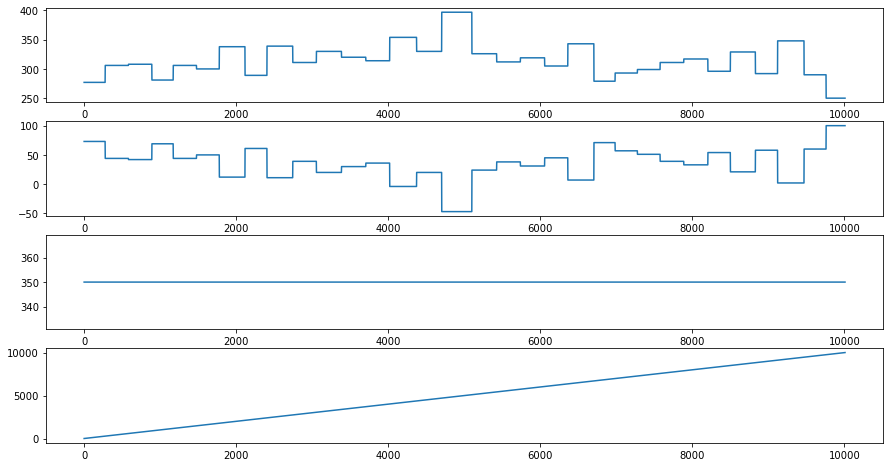

In [131]:
fig, ax = plt.subplots(4, 1, figsize=(15,8)) # This creates a figure of size 15x8 with
                                             # a 2x1 grid of subplots.

ax[0].plot(df.index.values, df['Slot_Uitlized_Count']) # The top-left axes
ax[1].plot(df.index.values, df['Slot_Uitlization_GAP']) # The top-right axes
ax[2].plot(df.index.values, df['Slot_CAP']) # The bottom-left axes
ax[3].plot(df.index.values, range(len(df))) # The bottom-right axes

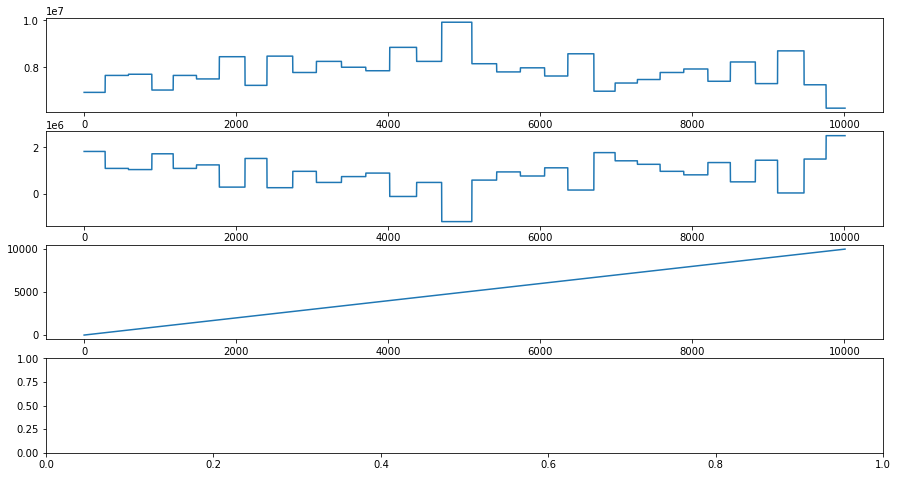

In [137]:
fig, ax = plt.subplots(4, 1, figsize=(15,8)) # This creates a figure of size 15x8 with
                                             # a 2x1 grid of subplots.

ax[0].plot(df.index.values, df['Acctual_Rev']) # The top-left axes
ax[1].plot(df.index.values, df['Estimat_Rev_Miss']) # The top-right axes
ax[2].plot(df.index.values, range(len(df))) # The bottom-right axes

In [ ]:
fig, ax = plt.subplots(3, 1, figsize=(15,18))

ax[0].bar(df.index.values, df['Slot_CAP'])
for i in range(df.shape[0]):
    ax[0].text(i, df['Slot_CAP'][i]+1, df['Slot_CAP'][i], horizontalalignment='center')
ax[0].legend('Slot Capacity')
    
ax[1].bar(df.index.values, df['Slot_Uitlization_GAP'])
for i in range(df.shape[0]):
    ax[1].text(i, df['Slot_Uitlization_GAP'][i]+1, df['Slot_Uitlization_GAP'][i], horizontalalignment='center')
ax[1].legend('Slot Not Uitlized')

ax[2].bar(df.index.values, df['Slot_CAP'])
ax[2].bar(df.index.values, df['Slot_Uitlization_GAP'], bottom=df['Slot_CAP'])

for i in range(df.shape[0]):
    ax[2].text(i, df['Slot_CAP'][i]+df['Slot_Uitlization_GAP'][i]+1, df['Slot_CAP'][i]+df['Slot_Uitlization_GAP'][i], horizontalalignment='center')
ax[2].legend(['Slot Capacity','Slot Not Uitlized'])

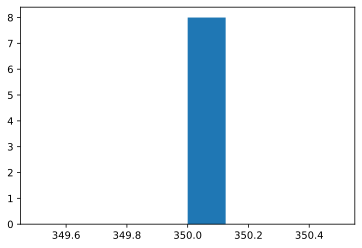

In [27]:


plt.hist(df['Slot_CAP'],bins = 8, density=True);

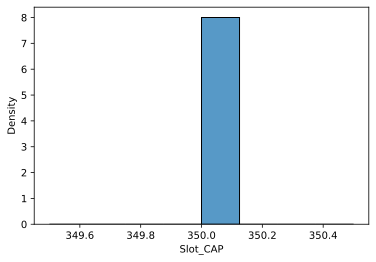

In [29]:
sns.histplot(df['Slot_CAP'], kde=False,bins=8, stat='density');

In [127]:

df


,TERMINAL,AIRPORT_STRCTR_NM,AIRPORT_STRCTR_CODE,A/D,ARCFT_TYP,ARCFT_RGSTR,MAX_TAKE_OFF_WEIGHT,CARR_NME,CARR_COUNTRY_CODE,CARR_COUNTRY,...,INFANTS,DELAY_CATEGORY,OFFICIAL_DELAY_CATEGORY,Flights_Rev,Slot_CAP,Slot_Price,Slot_Uitlized_Count,Slot_Uitlization_GAP,Estimat_Rev_Miss,Acctual_Rev
0,T1,APRON A- BAY A25,A25,A,Airbus A320-100/200,HZAS83,73500.0,SAUDI ARABIAN AIRLINES,KSA,SAUDI ARABIA,...,1.0,Delay 1 To 15 Mins,On Time,25000,350.0,25000,277.0,73.0,1825000,6925000
1,T1,APRON A- BAY A4L,A4L,D,Airbus A320-100/200,HZAS78,73500.0,SAUDI ARABIAN AIRLINES,KSA,SAUDI ARABIA,...,2.0,Delay 1 To 15 Mins,On Time,25000,350.0,25000,277.0,73.0,1825000,6925000
2,T1,APRON 5 - BAY 04,05-04,A,Boeing 737-500 pax,YAKMS,NaN,KAM AIR CO. LTD.,AFG,AFGHANISTAN,...,0.0,Delay 1 To 15 Mins,On Time,25000,350.0,25000,277.0,73.0,1825000,6925000
3,T1,APRON A- BAY A11R,A11R,A,Airbus A320-100/200,HZ-FAD,77000.0,FLYADEAL,KSA,SAUDI ARABIA,...,2.0,Delay 31 To 45 Mins,Delay,25000,350.0,25000,277.0,73.0,1825000,6925000
4,T1,APRON 1 - BAY 02,01-02,A,NaN,HZ-AK35,351534.0,SAUDI ARABIAN AIRLINES,KSA,SAUDI ARABIA,...,0.0,Delay 31 To 45 Mins,Delay,25000,350.0,25000,277.0,73.0,1825000,6925000
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
10004,T1,APRON A- BAY A6L,A6L,D,Airbus A320-100/200,HZ-AS68,73500.0,SAUDI ARABIAN AIRLINES,KSA,SAUDI ARABIA,...,2.0,Delay Than One Hour,Delay,25000,350.0,25000,250.0,100.0,2500000,6250000
10005,T1,APRON A- BAY A21,A21,D,Airbus A320-100/200,HZFAH,77000.0,FLYADEAL,KSA,SAUDI ARABIA,...,3.0,Delay Than One Hour,Delay,25000,350.0,25000,250.0,100.0,2500000,6250000
10006,T1,APRON A- BAY A10L,A10L,A,Airbus A320-100/200,HZ-FAD,77000.0,FLYADEAL,KSA,SAUDI ARABIA,...,5.0,Delay Than One Hour,Delay,25000,350.0,25000,250.0,100.0,2500000,6250000
10007,T1,APRON 5 - BAY 02,05-02,A,Airbus A320-100/200,SUBQL,NaN,NILE AIR,EGY,Egypt,...,5.0,Delay Than One Hour,Delay,25000,350.0,25000,250.0,100.0,2500000,6250000


In [128]:
df['Slot_CAP']=df['Slot_CAP'].astype(float)
df['Slot_Uitlized_Count']=df['Slot_Uitlized_Count'].astype(float)
df['Slot_Uitlization_GAP']=df['Slot_Uitlization_GAP'].astype(float)

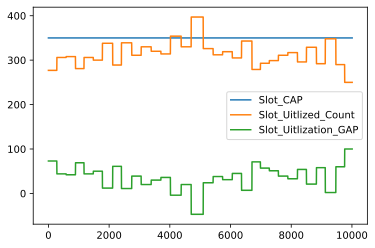

In [148]:
df[['Slot_CAP', 'Slot_Uitlized_Count', 'Slot_Uitlization_GAP']].plot()
plt.show()

In [156]:
data11 = [df['Slot_CAP'],
df['Slot_Uitlized_Count'],
df['Slot_Uitlization_GAP']]
X = np.arange(4)
fig11 = plt.figure()
ax = fig11.add_axes([0,0,1,1])
ax.bar('Slot Capicty', data11[0], color = 'b', width = 0.25)
ax.bar('Slot Uitilized', data11[1], color = 'g', width = 0.25)
ax.bar( 'Free Slot', data11[2], color = 'r', width = 0.25)

<BarContainer object of 10009 artists>

In [157]:
data111 = [df['Acctual_Rev'],
df['Estimat_Rev_Miss']]
X = np.arange(4)
fig11 = plt.figure()
ax = fig11.add_axes([0,0,1,1])
ax.bar('Rev', data111[0], color = 'b', width = 0.25)
ax.bar('Revnue Miss', data111[1], color = 'g', width = 0.25)


<BarContainer object of 10009 artists>

# LinearRegression

In [158]:
import statsmodels.api as sm
import statsmodels.formula.api as smf
import patsy
import seaborn as sns
import matplotlib.pyplot as plt
from sklearn.linear_model import LinearRegression
from sklearn.linear_model import RidgeCV
%matplotlib inline

In [174]:
df.columns

Index(['TERMINAL', 'AIRPORT_STRCTR_NM', 'AIRPORT_STRCTR_CODE', 'A/D',
       'ARCFT_TYP', 'ARCFT_RGSTR', 'MAX_TAKE_OFF_WEIGHT', 'CARR_NME',
       'CARR_COUNTRY_CODE', 'CARR_COUNTRY', 'FLT_NMBR', 'IATA', 'CTGRY',
       'DTE_SCHD', 'TME_SCHD', 'DTE_ACTL', 'TME_ACTL', 'TME_DIFF',
       'FLIGHT_BLOCK_ON_OFF_TIME', 'FLIGHT_TOUCH_DOWN_TAKE_OFF_TIM', 'ORGN',
       'ORGN_ICAO', 'ORGN_AIRPORT', 'ORGN_CITY', 'ORGN_COUNTRY', 'DESTN',
       'DESTN_ICAO', 'DESTN_AIRPORT', 'DESTN_CITY', 'DESTN_COUNTRY', 'TOT_PAX',
       'FRS_PAX', 'BSN_PAX', 'ECO_PAX', 'TRN_PAX', 'HAJ_PAX', 'UMR_PAX',
       'MAIL', 'CARGO', 'INFANTS', 'DELAY_CATEGORY', 'OFFICIAL_DELAY_CATEGORY',
       'Flights_Rev', 'Slot_CAP', 'Slot_Price', 'Slot_Uitlized_Count',
       'Slot_Uitlization_GAP', 'Estimat_Rev_Miss', 'Acctual_Rev'],
      dtype='object')

In [175]:
df.columns = df.columns.map(str.strip)
df.columns

Index(['TERMINAL', 'AIRPORT_STRCTR_NM', 'AIRPORT_STRCTR_CODE', 'A/D',
       'ARCFT_TYP', 'ARCFT_RGSTR', 'MAX_TAKE_OFF_WEIGHT', 'CARR_NME',
       'CARR_COUNTRY_CODE', 'CARR_COUNTRY', 'FLT_NMBR', 'IATA', 'CTGRY',
       'DTE_SCHD', 'TME_SCHD', 'DTE_ACTL', 'TME_ACTL', 'TME_DIFF',
       'FLIGHT_BLOCK_ON_OFF_TIME', 'FLIGHT_TOUCH_DOWN_TAKE_OFF_TIM', 'ORGN',
       'ORGN_ICAO', 'ORGN_AIRPORT', 'ORGN_CITY', 'ORGN_COUNTRY', 'DESTN',
       'DESTN_ICAO', 'DESTN_AIRPORT', 'DESTN_CITY', 'DESTN_COUNTRY', 'TOT_PAX',
       'FRS_PAX', 'BSN_PAX', 'ECO_PAX', 'TRN_PAX', 'HAJ_PAX', 'UMR_PAX',
       'MAIL', 'CARGO', 'INFANTS', 'DELAY_CATEGORY', 'OFFICIAL_DELAY_CATEGORY',
       'Flights_Rev', 'Slot_CAP', 'Slot_Price', 'Slot_Uitlized_Count',
       'Slot_Uitlization_GAP', 'Estimat_Rev_Miss', 'Acctual_Rev'],
      dtype='object')

In [176]:
df.shape

(10009, 49)

In [177]:
df.corr()

,MAX_TAKE_OFF_WEIGHT,DTE_SCHD,TME_SCHD,DTE_ACTL,TME_ACTL,TME_DIFF,FLIGHT_TOUCH_DOWN_TAKE_OFF_TIM,TOT_PAX,FRS_PAX,BSN_PAX,...,MAIL,CARGO,INFANTS,Flights_Rev,Slot_CAP,Slot_Price,Slot_Uitlized_Count,Slot_Uitlization_GAP,Estimat_Rev_Miss,Acctual_Rev
MAX_TAKE_OFF_WEIGHT,1.000000,-0.024079,-0.030448,-0.024079,-0.029835,-0.021804,NaN,0.500460,NaN,NaN,...,0.142174,0.238815,0.162952,NaN,NaN,NaN,-0.000774,0.000774,0.000774,-0.000774
DTE_SCHD,-0.024079,1.000000,-0.033773,1.000000,-0.033485,-0.010281,NaN,-0.017293,NaN,NaN,...,0.004379,0.011271,-0.052339,NaN,NaN,NaN,-0.282380,0.282380,0.282380,-0.282380
TME_SCHD,-0.030448,-0.033773,1.000000,-0.033773,0.999601,0.017751,NaN,0.022044,NaN,NaN,...,-0.013411,-0.001620,0.075696,NaN,NaN,NaN,0.025020,-0.025020,-0.025020,0.025020
DTE_ACTL,-0.024079,1.000000,-0.033773,1.000000,-0.033485,-0.010281,NaN,-0.017293,NaN,NaN,...,0.004379,0.011271,-0.052339,NaN,NaN,NaN,-0.282380,0.282380,0.282380,-0.282380
TME_ACTL,-0.029835,-0.033485,0.999601,-0.033485,1.000000,-0.010512,NaN,0.022523,NaN,NaN,...,-0.012751,-0.001737,0.075835,NaN,NaN,NaN,0.025039,-0.025039,-0.025039,0.025039
TME_DIFF,-0.021804,-0.010281,0.017751,-0.010281,-0.010512,1.000000,NaN,-0.016871,NaN,NaN,...,-0.023399,0.004116,-0.004569,NaN,NaN,NaN,-0.000575,0.000575,0.000575,-0.000575
FLIGHT_TOUCH_DOWN_TAKE_OFF_TIM,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
TOT_PAX,0.500460,-0.017293,0.022044,-0.017293,0.022523,-0.016871,NaN,1.000000,NaN,NaN,...,0.078647,-0.055947,0.381485,NaN,NaN,NaN,-0.012167,0.012167,0.012167,-0.012167
FRS_PAX,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
BSN_PAX,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


# Score  for Slot Uitilization

In [180]:
lr1 = LinearRegression()
X = df[['Slot_CAP', 'Slot_Uitlized_Count']]
y = df['Slot_Uitlization_GAP']
lr1.fit(X, y)
lr1.score(X, y)

1.0

# Score  for Estimate Rev Miss

In [182]:
lr2 = LinearRegression()
X2 = df[['Slot_Price', 'Acctual_Rev']]
y2 = df['Estimat_Rev_Miss']
lr2.fit(X2, y2)
lr2.score(X2, y2)

1.0

# Validation Workflow and Utilities

In [183]:
from sklearn.model_selection import train_test_split
from sklearn.linear_model import LinearRegression, Ridge #ordinary linear regression + w/ ridge regularization
from sklearn.preprocessing import StandardScaler, PolynomialFeatures

X3 = df[['Slot_CAP', 'Slot_Uitlized_Count']]
y3 = df['Slot_Uitlization_GAP']

# hold out 20% of the data for final testing
X3, X3_test, y3, y3_test = train_test_split(X3, y3, test_size=.2, random_state=10)

In [184]:
X3_train, X3_val, y3_train, y3_val = train_test_split(X3, y3, test_size=.25, random_state=3)

In [185]:
lm = LinearRegression()


scaler = StandardScaler()

X3_train_scaled = scaler.fit_transform(X3_train.values)
X3_val_scaled = scaler.transform(X3_val.values)
X3_test_scaled = scaler.transform(X3_test.values)

lm_reg = Ridge(alpha=1)

poly = PolynomialFeatures(degree=2) 

X3_train_poly = poly.fit_transform(X3_train.values)
X3_val_poly = poly.transform(X3_val.values)
X3_test_poly = poly.transform(X3_test.values)

lm_poly = LinearRegression()

In [186]:
lm.fit(X3_train, y3_train)
print(f'Linear Regression val R^2: {lm.score(X3_val, y3_val):.3f}')

lm_reg.fit(X3_train_scaled, y3_train)
print(f'Ridge Regression val R^2: {lm_reg.score(X3_val_scaled, y3_val):.3f}')

lm_poly.fit(X3_train_poly, y3_train)
print(f'Degree 2 polynomial regression val R^2: {lm_poly.score(X3_val_poly, y3_val):.3f}')

Linear Regression val R^2: 1.000
Ridge Regression val R^2: 1.000
Degree 2 polynomial regression val R^2: 1.000


In [187]:
lm.fit(X3,y3)
print(f'Linear Regression test R^2: {lm.score(X3_test, y3_test):.3f}')

Linear Regression test R^2: 1.000


# Random forest & Decision tree & Logistic Regression

In [188]:
import matplotlib.cm as cm
import random
from sklearn.tree import DecisionTreeClassifier
from sklearn.ensemble import RandomForestClassifier
from sklearn.linear_model import LogisticRegression

In [200]:
from sklearn.model_selection import train_test_split

def quick_test(model, X, y):
    xtrain, xtest, ytrain, ytest = train_test_split(X, y, test_size=0.3)
    model.fit(xtrain, ytrain)
    return model.score(xtest, ytest)

def quick_test_afew_times(model, X, y, n=10):
    return np.mean([quick_test(model, X, y) for j in range(n)])

In [ ]:
logreg = LogisticRegression(penalty='none')
quick_test_afew_times(logreg, X, y)

In [196]:
decisiontree = DecisionTreeClassifier(max_depth=4)
quick_test_afew_times(decisiontree, X, y)

0.43123543123543123

In [202]:
randomforest = RandomForestClassifier(n_estimators=100)
quick_test_afew_times(randomforest, X, y)

1.0